In [1]:
from ohsome import OhsomeClient

import altair as alt
import altair_tiles as til
import geopandas as gpd
import pandas as pd

import json
import osm2geojson
import requests

import datetime

In [2]:
#alt.data_transformers.enable("vegafusion")

In [3]:
#This Script gets a geometry from osm via overpass and gets a osm streetnetwork incl history for this geometry.

# get geometry

In [4]:
## Should use [out:json] in the query as later osmtogeojson does not parse XML
query = """
[out:json][timeout:25];
area[name="Berlin"]->.searchArea;
(relation["admin_level"="9"]["name"="Neukölln"](area.searchArea););
out body;
>;
out skel qt;
"""

url = "http://overpass-api.de/api/interpreter"
r = requests.get(url, params={'data': query})#,  proxies=proxies)

res_geojson = osm2geojson.json2geojson(r.json())

In [5]:
gdf_osm_shape = gpd.GeoDataFrame.from_features(res_geojson, crs="4326")
gdf_osm_shape

,geometry,type,id,tags
0,"MULTIPOLYGON (((13.39949 52.41802, 13.39978 52...",relation,162902,"{'TMC:cid_58:tabcd_1:Class': 'Area', 'TMC:cid_..."
1,POINT (13.46176 52.44597),node,1779489655,NaN


In [6]:
# got bbox from: https://geojson.io/#new&map=15.24/52.466861/13.432173
#gdf_osm_shape = gpd.read_file("bbox_hermannstr.geojson")

In [7]:
#gdf_osm_shape

<Axes: >

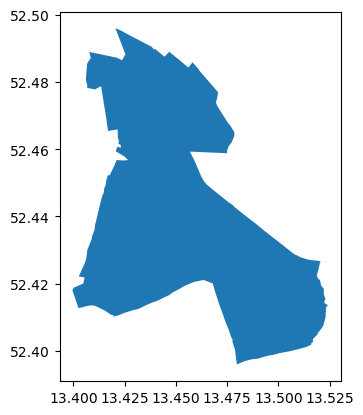

In [8]:
gdf_osm_shape_poly=gdf_osm_shape[gdf_osm_shape["type"]=="relation"]
gdf_osm_shape_poly.plot()

In [9]:
#gdf_osm_shape_poly.buffer(0.0001)

# get network incl. history

In [10]:
client = OhsomeClient()

In [11]:
time = "2008-01-01,2024-01-01"
fltr = "highway=* and maxspeed=* and type:way"
properties = "tags" # to retreive OSM tags along with the geometries
bpolys=gdf_osm_shape_poly#.buffer(0.0001)

In [12]:
response = client.elementsFullHistory.geometry.post(bpolys=bpolys, time=time, filter=fltr, properties=properties, timeout=100)

In [13]:
response_df = response.as_dataframe()
response_df

geometry  \
@osmId         @validFrom          @validTo                                                                 
way/1000268036 2021-11-07 13:11:16 2022-01-25 14:56:26  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:26 2022-01-25 14:56:28  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:28 2022-01-25 14:56:30  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:30 2022-01-25 14:56:46  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:46 2022-12-15 23:33:21  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
...                                                                                                   ...   
way/999212810  2023-05-27 10:22:45 2023-07-01 15:38:43  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-07-01 15:38:43 2023-11-01 13:20:13  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-11-01 13:20:13 2023-11-03 06:41:54  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-11-03 06:41:54 2023-11-11 11:35:28  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-11-11 11:35:28 2024-01-01 00:00:00  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   

                                                                                              @other_tags  
@osmId         @validFrom          @validTo                                                                
way/1000268036 2021-11-07 13:11:16 2022-01-25 14:56:26  {'foot': 'use_sidepath', 'highway': 'residenti...  
               2022-01-25 14:56:26 2022-01-25 14:56:28  {'foot': 'use_sidepath', 'highway': 'residenti...  
               2022-01-25 14:56:28 2022-01-25 14:56:30  {'foot': 'use_sidepath', 'highway': 'residenti...  
               2022-01-25 14:56:30 2022-01-25 14:56:46  {'foot': 'use_sidepath', 'highway': 'residenti...  
               2022-01-25 14:56:46 2022-12-15 23:33:21  {'foot': 'use_sidepath', 'highway': 'residenti...  
...                                                                                                   ...  
way/999212810  2023-05-27 10:22:45 2023-07-01 15:38:43  {'cycleway:right': 'lane', 'cycleway:right:buf...  
               2023-07-01 15:38:43 2023-11-01 13:20:13  {'cycleway:right': 'lane', 'cycleway:right:buf...  
               2023-11-01 13:20:13 2023-11-03 06:41:54  {'cycleway:right': 'lane', 'cycleway:right:buf...  
               2023-11-03 06:41:54 2023-11-11 11:35:28  {'cycleway:right': 'lane', 'cycleway:right:buf...  
               2023-11-11 11:35:28 2024-01-01 00:00:00  {'cycleway:right': 'lane', 'cycleway:right:buf...  

[62828 rows x 2 columns]

### adding tags to df

In [14]:
def addingExtraTags(df_):
    df=df_.copy()
    for ind,row in df.iterrows():        
        tags = row['@other_tags']
        # Print the keys and values
        for key, value in tags.items():
            if key=="maxspeed":
                df.at[ind, "maxspeed"] = value
            if key=="maxspeed:conditional":
                df.at[ind, "maxspeed:conditional"] = value
            if key=="highway":
                df.at[ind, "highway"] = value
            if key=="name":
                df.at[ind, "name"] = value

    return df

In [15]:
selected_ms=addingExtraTags(response_df)
selected_ms

geometry  \
@osmId         @validFrom          @validTo                                                                 
way/1000268036 2021-11-07 13:11:16 2022-01-25 14:56:26  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:26 2022-01-25 14:56:28  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:28 2022-01-25 14:56:30  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:30 2022-01-25 14:56:46  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
               2022-01-25 14:56:46 2022-12-15 23:33:21  LINESTRING (13.44751 52.48090, 13.44776 52.481...   
...                                                                                                   ...   
way/999212810  2023-05-27 10:22:45 2023-07-01 15:38:43  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-07-01 15:38:43 2023-11-01 13:20:13  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-11-01 13:20:13 2023-11-03 06:41:54  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-11-03 06:41:54 2023-11-11 11:35:28  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   
               2023-11-11 11:35:28 2024-01-01 00:00:00  LINESTRING (13.43116 52.46790, 13.43103 52.46798)   

                                                                                              @other_tags  \
@osmId         @validFrom          @validTo                                                                 
way/1000268036 2021-11-07 13:11:16 2022-01-25 14:56:26  {'foot': 'use_sidepath', 'highway': 'residenti...   
               2022-01-25 14:56:26 2022-01-25 14:56:28  {'foot': 'use_sidepath', 'highway': 'residenti...   
               2022-01-25 14:56:28 2022-01-25 14:56:30  {'foot': 'use_sidepath', 'highway': 'residenti...   
               2022-01-25 14:56:30 2022-01-25 14:56:46  {'foot': 'use_sidepath', 'highway': 'residenti...   
               2022-01-25 14:56:46 2022-12-15 23:33:21  {'foot': 'use_sidepath', 'highway': 'residenti...   
...                                                                                                   ...   
way/999212810  2023-05-27 10:22:45 2023-07-01 15:38:43  {'cycleway:right': 'lane', 'cycleway:right:buf...   
               2023-07-01 15:38:43 2023-11-01 13:20:13  {'cycleway:right': 'lane', 'cycleway:right:buf...   
               2023-11-01 13:20:13 2023-11-03 06:41:54  {'cycleway:right': 'lane', 'cycleway:right:buf...   
               2023-11-03 06:41:54 2023-11-11 11:35:28  {'cycleway:right': 'lane', 'cycleway:right:buf...   
               2023-11-11 11:35:28 2024-01-01 00:00:00  {'cycleway:right': 'lane', 'cycleway:right:buf...   

                                                            highway maxspeed  \
@osmId         @validFrom          @validTo                                    
way/1000268036 2021-11-07 13:11:16 2022-01-25 14:56:26  residential       30   
               2022-01-25 14:56:26 2022-01-25 14:56:28  residential       30   
               2022-01-25 14:56:28 2022-01-25 14:56:30  residential       30   
               2022-01-25 14:56:30 2022-01-25 14:56:46  residential       30   
               2022-01-25 14:56:46 2022-12-15 23:33:21  residential       30   
...                                                             ...      ...   
way/999212810  2023-05-27 10:22:45 2023-07-01 15:38:43    secondary       30   
               2023-07-01 15:38:43 2023-11-01 13:20:13    secondary       30   
               2023-11-01 13:20:13 2023-11-03 06:41:54    secondary       30   
               2023-11-03 06:41:54 2023-11-11 11:35:28    secondary       30   
               2023-11-11 11:35:28 2024-01-01 00:00:00    secondary       30   

                                                                  name  \
@osmId         @validFrom          @validTo                              
way/1000268036 2021-11-07 13:11:16 2022-01-25 14:56:26  Roseggerstraße  

In [16]:
#print (selected_ms[:10])

### cleanup: drop/rename columns

In [17]:
selected_ms=selected_ms.drop(columns=['@other_tags'])

In [18]:
selected_ms_highway=selected_ms[selected_ms.highway=="secondary"].copy()

In [19]:
selected_ms_highway=selected_ms[selected_ms.highway.isin(["secondary","tertiary"])].copy()

In [20]:
selected_ms_highway=selected_ms[selected_ms.highway.isin(["primary","secondary","tertiary","primary_link","secondary_link","tertiary_link"])].copy()

In [21]:
selected_ms_highway=selected_ms_highway.reset_index().copy()

In [22]:
selected_ms_highway.columns

Index(['@osmId', '@validFrom', '@validTo', 'geometry', 'highway', 'maxspeed',
       'name', 'maxspeed:conditional'],
      dtype='object')

In [23]:
selected_ms_highway=selected_ms_highway.rename(columns={'@osmId':'osmId', '@validFrom':'validFrom', '@validTo':'validTo', '@other_tags':'other_tags'})

In [24]:
#alt.data_transformers.enable("vegafusion")

In [25]:
#alt.renderers.enable("jupyter")

In [26]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

# viz

In [29]:
###### Darstellung mit Basemap aber ohne Zeitstrahl

In [27]:
import pandas as pd
import altair as alt
from datetime import datetime


# Beispiel-Daten laden
#data = selected_ms_highway[:5000].copy()
data = selected_ms_highway.copy()


# Konvertiere die Zeitspalten in datetime-Objekte
data['validFrom'] = pd.to_datetime(data['validFrom'])
data['validTo'] = pd.to_datetime(data['validTo'])

# Konvertiere die Zeitspalten in Unix-Timestamps (numerisch)
data['validFrom_ts'] = data['validFrom'].apply(lambda x: x.timestamp())
data['validTo_ts'] = data['validTo'].apply(lambda x: x.timestamp())

# Definiere den Zeitbereich für den Slider
min_time = data['validFrom_ts'].min()
max_time = data['validTo_ts'].max()

# Slider zur Auswahl eines Zeitpunkts
time_range = alt.binding_range(min=min_time, max=max_time, step=3600, name='Time') #, width=300

# Auswahl basierend auf dem Slider
time_selection = alt.param(value=min_time, bind=time_range)

# Funktion zur Formatierung des Timestamps in ein lesbares Datum
def format_timestamp(ts):
    return datetime.utcfromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S')



##### TIME #####
# Textanzeige des ausgewählten Jahres, Monats und Tages
year_display = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text(
    align='left',
    dx=-300,
    dy=360,
    fontSize=18
).transform_calculate(
    # Berechnung des Jahres aus dem Slider-Wert (time_selection)
    selected_year="year(datetime({0} * 1000))".format(time_selection.name)
).encode(
    text='selected_year:N'  # Zeigt das ausgewählte Jahr an
)

# Textanzeige des ausgewählten Jahres, Monats und Tages
month_display = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text(
    align='left',
    dx=-250,
    dy=360,
    fontSize=18
).transform_calculate(
    # Berechnung des Jahres aus dem Slider-Wert (time_selection)
    selected_month="month(datetime({0} * 1000))".format(time_selection.name)
).encode(
    text='selected_month:N'  # Zeigt das ausgewählte Jahr an
)

##### GEO #####
# Poly Umriss
gdf_osm_shape_poly_utm=gdf_osm_shape_poly.to_crs(25832)
gdf_osm_shape_poly_b_utm=gdf_osm_shape_poly_utm.buffer(0.0001)
gdf_osm_shape_poly_b=gdf_osm_shape_poly_b_utm.to_crs(4326)
geoshape_base=alt.Chart(gdf_osm_shape_poly_b).mark_geoshape(opacity=0.08)


# Linien visualisieren
geoshape_chart = alt.Chart(data).mark_geoshape(fillOpacity=0, 
                   #stroke="green",
                   strokeWidth=2,).encode(
    stroke=alt.Stroke("maxspeed:Q", legend={"symbolFillColor":'gray', "symbolStrokeWidth":7}).scale(domain=[10, 80],scheme="redyellowgreen", reverse=True),
      # Einfärbung nach maxspeed
    tooltip=[
        alt.Tooltip('osmId:N', title="osmId"),
        alt.Tooltip('validFrom:N', title="Valid From"),
        alt.Tooltip('validTo:N', title="Valid To"),
        alt.Tooltip('maxspeed:Q', title="Maxspeed"),
        alt.Tooltip('highway:N', title="Highway"),
        alt.Tooltip('name:N', title="Name")
    ]
).transform_filter(
    # Filter basierend auf dem ausgewählten Zeitintervall
    (alt.datum['validFrom_ts'] <= time_selection) &
    (alt.datum['validTo_ts'] >= time_selection)
).project(
    type='mercator'  # Mercator-Projektion für Geo-Daten
)#.interactive()

# BASEMAP
til_geo=til.add_tiles(geoshape_base, provider=til.providers.CartoDB.Positron)#.properties(width=600, height=400)


# Render das Chart
chart = til_geo + geoshape_chart + year_display +month_display 


chart = chart.add_params(
    time_selection
)

chart=chart.properties(width=600, height=800)


#chart=chart.interactive()

In [28]:
chart.save("maps_nk_basemap_PrimSecTert_24-11-04.html")

In [119]:
import altair as alt
print (alt.__version__)

5.4.1


In [132]:
data.maxspeed.unique()

array(['50', '30', '10', '40', '30;50'], dtype=object)

In [ ]:
###### Darstellung ohne Basemap aber mit Zeitstrahl

In [46]:
import pandas as pd
import altair as alt
from datetime import datetime


# Beispiel-Daten laden
#data = selected_ms_highway[:5000].copy()
data = selected_ms_highway.copy()


chart_title = alt.TitleParams(
    ["Änderungen der zul. Geschwindigkeit (OSM, maxspeed) im zeitlicher Verlauf","im Berliner Bezirk Neukölln"],
    subtitle=["", "© OpenStreetMap contributors powered by ohsome API","created by FG Radverkehr - TH Wildau"],
)


# Konvertiere die Zeitspalten in datetime-Objekte
data['validFrom'] = pd.to_datetime(data['validFrom'])
data['validTo'] = pd.to_datetime(data['validTo'])

min_time_dt = data['validFrom'].min()
max_time_dt = data['validTo'].max()

# Konvertiere die Zeitspalten in Unix-Timestamps (numerisch)
data['validFrom_ts'] = data['validFrom'].apply(lambda x: x.timestamp())
data['validTo_ts'] = data['validTo'].apply(lambda x: x.timestamp())

# Definiere den Zeitbereich für den Slider
min_time = data['validFrom_ts'].min()
max_time = data['validTo_ts'].max()

# Slider zur Auswahl eines Zeitpunkts
time_range = alt.binding_range(min=min_time, max=max_time, step=3600, name='Time') #, width=300

# Auswahl basierend auf dem Slider
time_selection = alt.param(value=min_time, bind=time_range)

# Funktion zur Formatierung des Timestamps in ein lesbares Datum
def format_timestamp(ts):
    return datetime.utcfromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S')



##### TIME #####
# Textanzeige des ausgewählten Jahres, Monats und Tages
year_display = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text(
    align='left',
    dx=-300,
    dy=360,
    fontSize=18
).transform_calculate(
    # Berechnung des Jahres aus dem Slider-Wert (time_selection)
    selected_year="year(datetime({0} * 1000))".format(time_selection.name)
).encode(
    text='selected_year:N'  # Zeigt das ausgewählte Jahr an
)

# Textanzeige des ausgewählten Jahres, Monats und Tages
month_display = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text(
    align='left',
    dx=-250,
    dy=360,
    fontSize=18
).transform_calculate(
    # Berechnung des Jahres aus dem Slider-Wert (time_selection)
    selected_month="month(datetime({0} * 1000))+1".format(time_selection.name)
).encode(
    text='selected_month:N'  # Zeigt das ausgewählte Jahr an
)


way_selection = alt.selection_point(fields=['osmId'], on='click', empty='none')

#### WAY ####
sel_chart = alt.Chart(data).mark_line(dy=-100).encode(
    x=alt.X('validFrom:T',
            scale=alt.Scale(domain=[min_time_dt, max_time_dt])),
    x2=alt.X2('validTo:T'),
    y=alt.Y('maxspeed:O', 
            scale=alt.Scale(domain=data.maxspeed.unique())),
    #color=alt.Color("@osmId:N",legend=None),
).transform_filter(
    way_selection
)

data_woDub=data.drop_duplicates(subset=['osmId'])[['osmId']]
base_url = "https://osmlab.github.io/osm-deep-history/#/way/"
# Dynamic text (title) with hyperlink based on the selected region
dynamic_title = alt.Chart(data_woDub).mark_text(
    align='center',  # Center the title
    fontSize=20,  # Font size for the title
    dx=30,
    dy=-10,# Adjust vertical position of the title
).transform_calculate(
    url="'https://osmlab.github.io/osm-deep-history/#/' + datum.osmId"  # Concatenate base URL and the selected 'id' field
).encode(
    text=alt.condition(
        way_selection, 'osmId:N', alt.value('')
    ),
    href=alt.condition(
        way_selection,
        'url:N',  # Reference the dynamically created URL
        alt.value('')  # Empty value when nothing is selected
    )

).add_params(
    way_selection
)




##### GEO #####
# Poly Umriss
gdf_osm_shape_poly_utm=gdf_osm_shape_poly.to_crs(25832)
gdf_osm_shape_poly_b_utm=gdf_osm_shape_poly_utm.buffer(0.0001)
gdf_osm_shape_poly_b=gdf_osm_shape_poly_b_utm.to_crs(4326)
geoshape_base=alt.Chart(gdf_osm_shape_poly_b).mark_geoshape(opacity=0.08)


# Linien visualisieren
geoshape_chart = alt.Chart(data, title=chart_title).mark_geoshape(fillOpacity=0, 
                   #stroke="green",
                   strokeWidth=2,).encode(
    stroke=alt.Stroke("maxspeed:Q", legend={"symbolFillColor":'gray', "symbolStrokeWidth":7,"orient":'left'}).scale(domain=[10, 80],scheme="redyellowgreen", reverse=True),
    #color=alt.Color('osmId:N', legend=alt.Legend(orient='right', offset=-150))
      # Einfärbung nach maxspeed
    tooltip=[
        alt.Tooltip('osmId:N', title="osmId"),
        alt.Tooltip('validFrom:T', title="Valid From"),
        alt.Tooltip('validTo:T', title="Valid To"),
        alt.Tooltip('maxspeed:Q', title="Maxspeed"),
        alt.Tooltip('highway:N', title="Highway"),
        alt.Tooltip('name:N', title="Name")
    ]
).transform_filter(
    # Filter basierend auf dem ausgewählten Zeitintervall
    (alt.datum['validFrom_ts'] <= time_selection) &
    (alt.datum['validTo_ts'] >= time_selection)
).add_params(
    way_selection
).project(
    type='mercator'  # Mercator-Projektion für Geo-Daten
)

# BASEMAP
#til_geo=til.add_tiles(geoshape_base, provider=til.providers.CartoDB.Positron)#.properties(width=600, height=400)
## Unfortunatly concatenation ist not yet supportet in altair tiles, therefore i will leave this for now
# https://github.com/vega/altair_tiles/issues/33

# Render das Chart
geo_chart = geoshape_base + geoshape_chart + year_display +month_display 


geo_chart = geo_chart.add_params(
    time_selection
)

geo_chart=geo_chart.properties(width=600, height=800)


#chart | sel_chart + dynamic_title

full_chrt=(geo_chart | dynamic_title & sel_chart ).resolve_scale(
    color='independent' 
).resolve_legend(
    color='independent' 
)



In [47]:
#geo_chart

In [31]:
# unable to viz in ju-lab for some unknown reason, however possible to export as working html
full_chrt

alt.HConcatChart(...)

In [48]:
full_chrt.save("maps_nk_no-basemap_PrimSecTert_wayChart_24-11-04.html")